In [5]:

from shapely.geometry import Point
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from sklearn.preprocessing import RobustScaler
from sklearn.decomposition import PCA
from sklearn.feature_selection import VarianceThreshold
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from shapely.geometry import box
import os
from sklearn.utils import shuffle
from sklearn.feature_selection import VarianceThreshold
from sklearn.cluster import AgglomerativeClustering
from prince import FAMD
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

In [20]:
df = pd.read_csv('Cleaned_dataset/grid/MERGED_FINAL_without_norm.csv')

In [21]:
df

,longitude,latitude,HWSD2_SMU_ID,COARSE,SAND,SILT,CLAY,TEXTURE_SOTER,BULK,REF_BULK,...,winter_tmax,spring_tmax,summer_tmax,autumn_tmax,winter_tmin,spring_tmin,summer_tmin,autumn_tmin,GRIDCODE,fire_count
0,-1.653868,34.000231,1767,3.0,40.0,40.0,20.0,M,1.49,1.71,...,12.0,20.0,34.00,22.000,0.00,7.0,17.0,9.000,201.0,1
1,-1.653868,34.000231,1767,18.0,66.0,22.0,12.0,C,1.37,1.56,...,12.0,20.0,34.00,22.000,0.00,7.0,17.0,9.000,201.0,1
2,-1.653868,34.000231,1767,12.0,57.0,27.0,16.0,M,1.43,1.65,...,12.0,20.0,34.00,22.000,0.00,7.0,17.0,9.000,201.0,1
3,-1.653868,34.000231,1767,16.0,47.0,30.0,23.0,M,1.42,1.76,...,12.0,20.0,34.00,22.000,0.00,7.0,17.0,9.000,201.0,1
4,-1.633868,34.000231,1767,3.0,40.0,40.0,20.0,M,1.49,1.71,...,14.0,23.0,35.50,23.500,2.00,8.0,19.0,11.000,201.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211484,9.846132,37.320231,31828,9.0,87.0,9.0,4.0,C,1.44,1.20,...,17.0,21.0,33.25,27.000,8.25,11.0,22.0,17.000,30.0,1
211485,9.846132,37.320231,31828,18.0,40.0,36.0,24.0,M,1.42,1.77,...,17.0,21.0,33.25,27.000,8.25,11.0,22.0,17.000,30.0,1
211486,9.866132,37.320231,7001,9.0,40.0,36.0,24.0,M,1.42,1.77,...,17.0,21.0,33.25,27.000,8.25,11.0,22.0,17.000,210.0,0
211487,9.746132,37.340231,31828,9.0,87.0,9.0,4.0,C,1.44,1.20,...,17.0,21.0,32.50,26.125,8.25,11.0,22.0,16.875,14.0,0


In [22]:
df = df.drop(columns=['Unnamed: 0', 'HWSD2_SMU_ID'], errors='ignore')
print(df.columns)
print(df.shape)

Index(['longitude', 'latitude', 'COARSE', 'SAND', 'SILT', 'CLAY',
       'TEXTURE_SOTER', 'BULK', 'REF_BULK', 'ORG_CARBON', 'PH_WATER',
       'TOTAL_N', 'CN_RATIO', 'CEC_SOIL', 'CEC_CLAY', 'CEC_EFF', 'TEB', 'BSAT',
       'ALUM_SAT', 'ESP', 'TCARBON_EQ', 'GYPSUM', 'ELEC_COND', 'elevation',
       'winter_prec', 'spring_prec', 'summer_prec', 'autumn_prec',
       'winter_tmax', 'spring_tmax', 'summer_tmax', 'autumn_tmax',
       'winter_tmin', 'spring_tmin', 'summer_tmin', 'autumn_tmin', 'GRIDCODE',
       'fire_count'],
      dtype='object')
(211489, 38)


In [23]:
def extract_random_split_save(df, 
                              file_specific='Cleaned_dataset/unsupervised/long_lat_attributes_freq.csv', 
                              file_rest='Cleaned_dataset/unsupervised/data_freq.csv'):
    
    specific_attributes = ['longitude', 'latitude']
    
    missing_cols = [col for col in specific_attributes if col not in df.columns]
    if missing_cols:
        print(f"Error: The following columns are missing from the data: {missing_cols}")
        return

    df_specific = df[specific_attributes]
    
    df_rest = df.drop(columns=specific_attributes)
    
    df_specific.to_csv(file_specific, index=False)
    df_rest.to_csv(file_rest, index=False)
    
    print(f"Process Complete.")
    print(f"Total rows in original: {len(df)}")
    print(f"Rows in sample (100%): {len(df)}")
    print(f"Saved specific columns to: {file_specific}")
    print(f"Saved rest of data to: {file_rest}")

In [ ]:
extract_random_split_save(df)
df = pd.read_csv('Cleaned_dataset/unsupervised/data_freq.csv')
long_lat_df = pd.read_csv('Cleaned_dataset/unsupervised/long_lat_attributes.csv')

Process Complete.
Total rows in original: 211489
Rows in sample (100%): 211489
Saved specific columns to: Cleaned_dataset/unsupervised/long_lat_attributes_freq.csv
Saved rest of data to: Cleaned_dataset/unsupervised/data_freq.csv


In [25]:
CATEGORICAL_COLS = ["GRIDCODE", "TEXTURE_SOTER"]

for col in CATEGORICAL_COLS:
    freq = df[col].value_counts(normalize=True)
    df[col] = df[col].map(freq)

In [26]:
scaler = RobustScaler()
X_scaled = scaler.fit_transform(df)

In [27]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.utils import shuffle

def silhouette_avg_kmeans(
    X,
    k,
    n_runs=4,
    sample_frac=0.2,
    random_state=42
):
    scores = []
    n_samples = int(len(X) * sample_frac)

    for i in range(n_runs):
        X_sample = shuffle(
            X,
            n_samples=n_samples,
            random_state=random_state + i
        )

        kmeans = KMeans(
            n_clusters=k,
            init="k-means++",
            n_init=10,
            max_iter=300,
            random_state=random_state + i
        )

        labels = kmeans.fit_predict(X_sample)
        score = silhouette_score(X_sample, labels)
        scores.append(score)

    return np.mean(scores), np.std(scores)

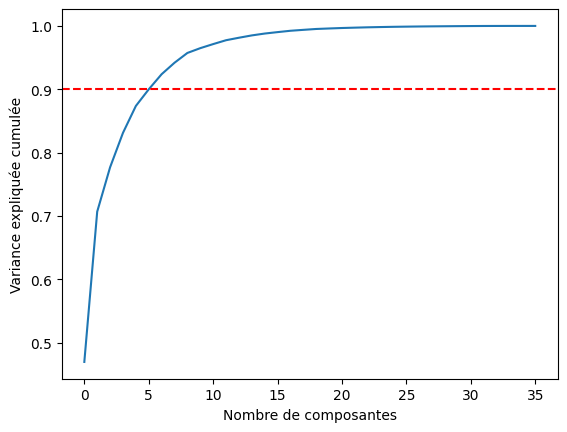

In [30]:
from sklearn.decomposition import PCA

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# On lance la PCA sur toutes les composantes possibles
pca = PCA().fit(X_scaled)

# On calcule la variance cumulée
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Nombre de composantes')
plt.ylabel('Variance expliquée cumulée')
plt.axhline(y=0.90, color='r', linestyle='--') # Ligne pour 90% de variance
plt.show()

# Option B : Laisser PCA choisir le nombre pour garder 90% de variance
# pca = PCA(n_components=0.90) 

X = pca.fit_transform(X_scaled)

In [31]:
# ==============================
# CONFIG
# ==============================
OUTPUT_DIR = "kmeans_models_outputs_freq"
os.makedirs(OUTPUT_DIR, exist_ok=True)

K_RANGE = range(3, 17)
SILHOUETTE_SAMPLE_RATIO = 0.20
SILHOUETTE_REPEATS = 4
BASE_RANDOM_STATE = 42

print("=" * 80)
print(f"DATA SHAPE (after PCA): {X.shape}")
print(f"K range: {list(K_RANGE)}")
print("=" * 80)

results = []

# ==============================
# MAIN LOOP
# ==============================
for k in K_RANGE:
    print("\n" + "#" * 80)
    print(f"TRAINING KMEANS | K = {k}")
    print("#" * 80)

    # --------------------------
    # Train on FULL DATA
    # --------------------------
    kmeans = KMeans(
        n_clusters=k,
        init="k-means++",
        n_init=10,
        max_iter=300,
        random_state=BASE_RANDOM_STATE
    )

    print("→ Fitting model on FULL dataset...")
    labels_full = kmeans.fit_predict(X)
    print("✓ Training completed")

    # --------------------------
    # Internal metrics (FULL DATA)
    # --------------------------
    db_index = davies_bouldin_score(X, labels_full)
    ch_index = calinski_harabasz_score(X, labels_full)

    print(f"  Davies-Bouldin     : {db_index:.4f}")
    print(f"  Calinski-Harabasz  : {ch_index:.4f}")

    # --------------------------
    # Silhouette (4 × 20%)
    # --------------------------
    silhouette_scores = []
    sample_size = int(SILHOUETTE_SAMPLE_RATIO * len(X))

    print(f"→ Silhouette on {SILHOUETTE_REPEATS} random 20% subsets")

    for i in range(SILHOUETTE_REPEATS):
        rs = BASE_RANDOM_STATE + i

        X_sub, labels_sub = shuffle(
            X, labels_full, random_state=rs
        )

        X_sub = X_sub[:sample_size]
        labels_sub = labels_sub[:sample_size]

        sil = silhouette_score(X_sub, labels_sub)
        silhouette_scores.append(sil)

        print(f"  Subset {i+1}: silhouette = {sil:.4f}")

    silhouette_avg = np.mean(silhouette_scores)
    print(f"→ Average silhouette: {silhouette_avg:.4f}")

    # --------------------------
    # Save clustered CSV
    # --------------------------
    clustered_df = df.copy()
    clustered_df["cluster"] = labels_full

    output_path = os.path.join(
        OUTPUT_DIR, f"data_kmeans_k{k}_pca.csv"
    )
    clustered_df.to_csv(output_path, index=False)

    print(f"✓ CSV saved: {output_path}")

    # --------------------------
    # Store results
    # --------------------------
    results.append({
        "k": k,
        "davies_bouldin": db_index,
        "calinski_harabasz": ch_index,
        "silhouette_avg": silhouette_avg
    })

# ==============================
# FINAL SUMMARY
# ==============================
results_df = pd.DataFrame(results)

summary_path = os.path.join(
    OUTPUT_DIR, f"kmeans_metrics_summary_pca.csv"
)
results_df.to_csv(summary_path, index=False)

print("\n" + "=" * 80)
print("FINAL METRICS SUMMARY")
print("=" * 80)
print(results_df)
print("\n✓ Summary saved to:", summary_path)

DATA SHAPE (after PCA): (211489, 36)
K range: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]

################################################################################
TRAINING KMEANS | K = 3
################################################################################
→ Fitting model on FULL dataset...
✓ Training completed
  Davies-Bouldin     : 0.4325
  Calinski-Harabasz  : 207639.8889
→ Silhouette on 4 random 20% subsets
  Subset 1: silhouette = 0.6982
  Subset 2: silhouette = 0.6950
  Subset 3: silhouette = 0.6977
  Subset 4: silhouette = 0.6966
→ Average silhouette: 0.6969
✓ CSV saved: kmeans_models_outputs_freq\data_kmeans_k3_pca.csv

################################################################################
TRAINING KMEANS | K = 4
################################################################################
→ Fitting model on FULL dataset...
✓ Training completed
  Davies-Bouldin     : 1.2427
  Calinski-Harabasz  : 170644.6368
→ Silhouette on 4 random 20% su

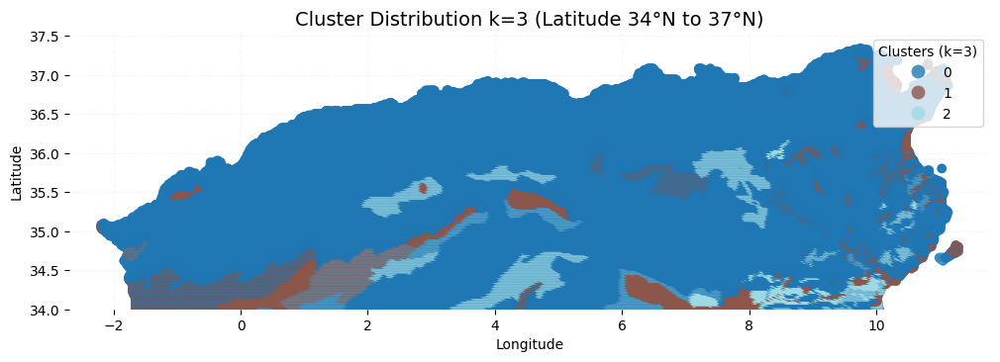

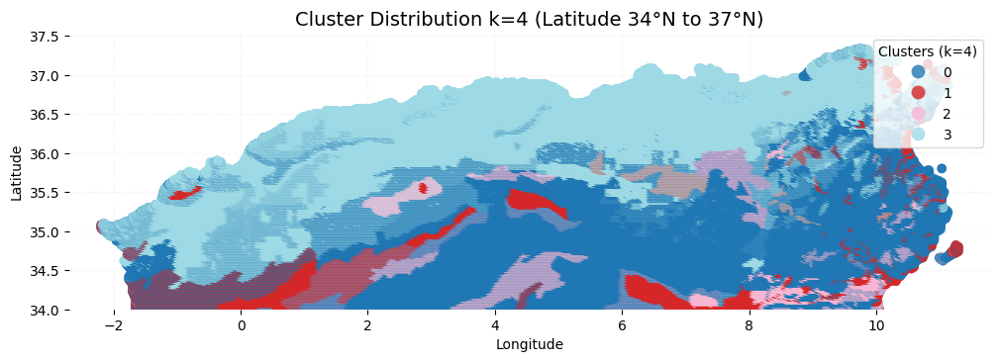

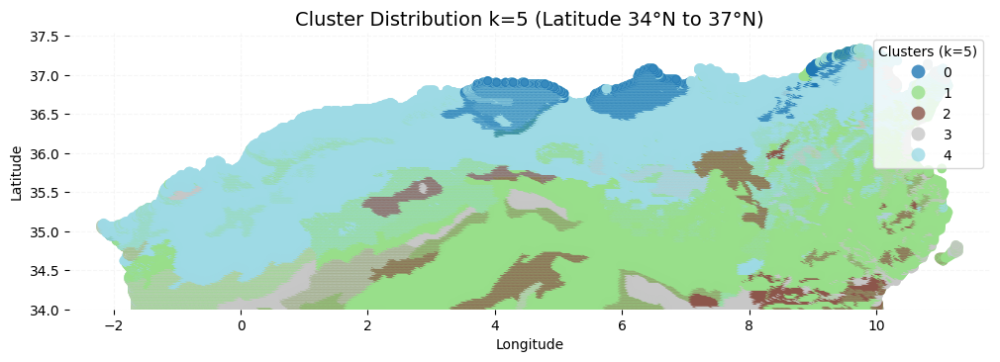

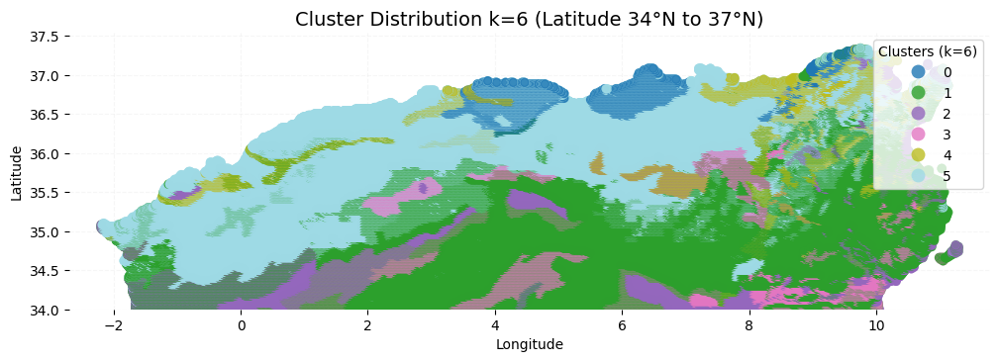

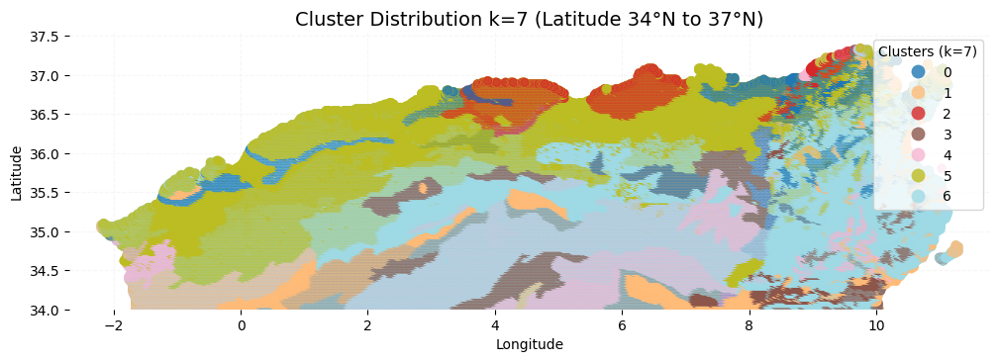

...

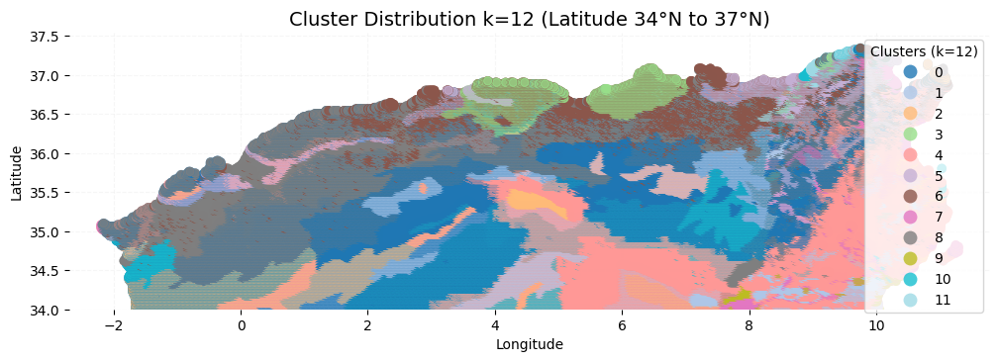

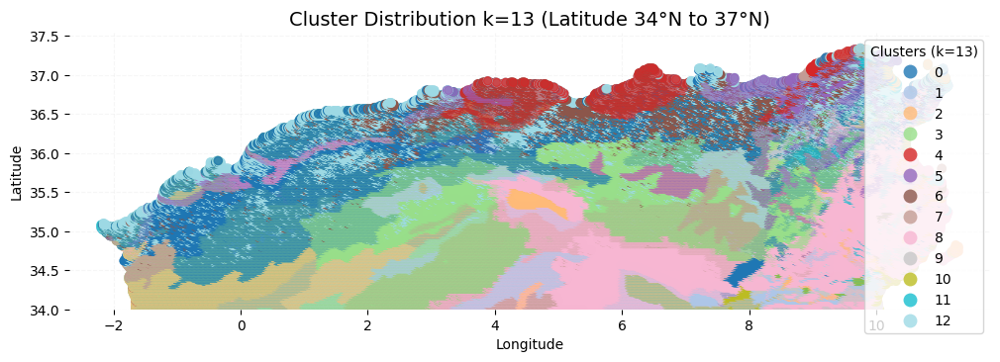

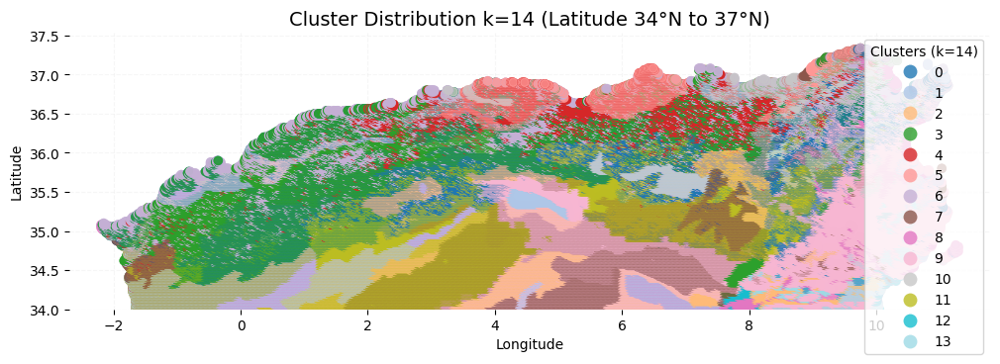

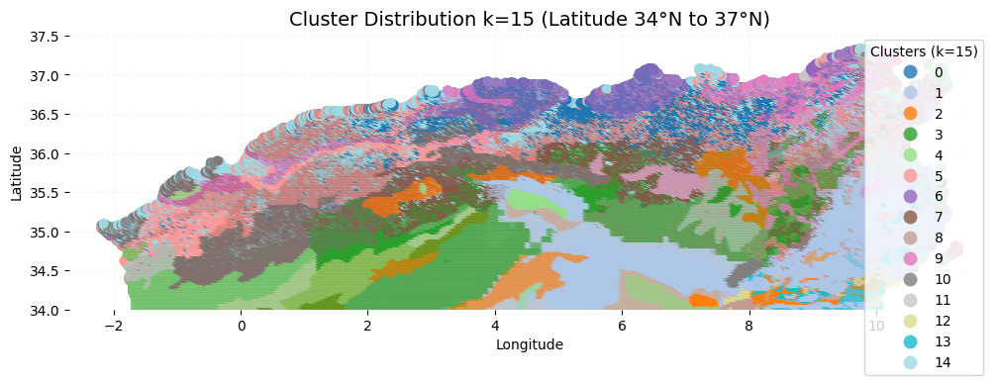

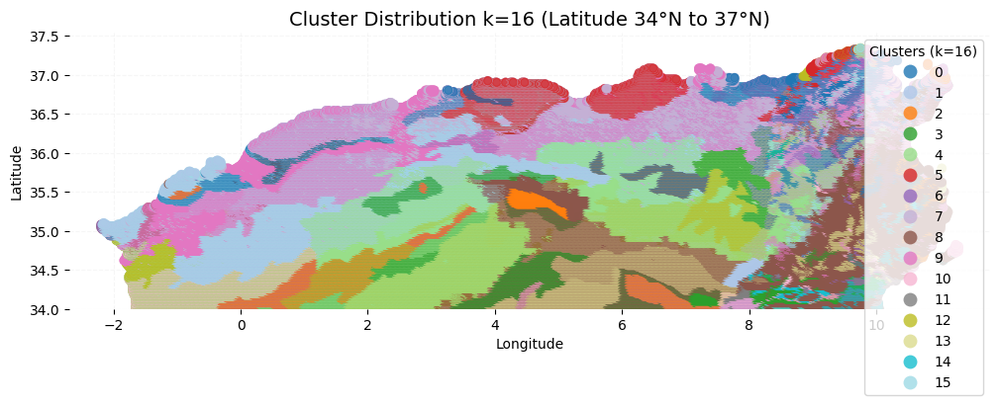

In [41]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import box
import os

# 1. Load coordinates (stays the same for all files)
coords = pd.read_csv("Cleaned_dataset/unsupervised/long_lat_attributes.csv")
lat_col = [c for c in coords.columns if 'lat' in c.lower()][0]
lon_col = [c for c in coords.columns if 'lon' in c.lower() or 'long' in c.lower()][0]

# 2. Prepare Map Data once (saves time and memory)
world_url = "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/world-countries.json"
world = gpd.read_file(world_url)
countries = world[world['name'].isin(["Algeria", "Tunisia"])]

# Clip map strictly to show Lat 34-40
xmin, ymin, xmax, ymax = countries.total_bounds
clipping_rect = box(xmin, 34, xmax, 40) 
countries_clipped = countries.clip(clipping_rect)

# 3. Loop through files from k=3 to k=16
for k in range(3, 17):
    file_path = f"kmeans_models_outputs_freq/data_kmeans_k{k}_pca.csv"
    
    # Check if file exists
    if not os.path.exists(file_path):
        continue

    # Load specific cluster file
    clusters = pd.read_csv(file_path)

    # Combine
    df = pd.concat([coords, clusters[['cluster']]], axis=1)

    # 4. Filter strictly for Latitude > 34
    df_filtered = df[df[lat_col] > 34].copy()

    # 5. Convert to GeoDataFrame
    gdf = gpd.GeoDataFrame(
        df_filtered, 
        geometry=gpd.points_from_xy(df_filtered[lon_col], df_filtered[lat_col]),
        crs="EPSG:4326"
    )

    # 6. Plotting (Exact style from your code)
    fig, ax = plt.subplots(figsize=(12, 12)) 

    # NO BLACK: Land is white, borders are invisible
    countries_clipped.plot(ax=ax, color='white', edgecolor='none', zorder=1)

    # Plot the clusters 
    # (Using tab20 because you have up to 16 clusters)
    gdf.plot(column='cluster', 
             ax=ax, 
             categorical=True, 
             legend=True, 
             cmap='tab20', 
             markersize=35,      
             alpha=0.8,          
             zorder=2,
             legend_kwds={'title': f"Clusters (k={k})", 'loc': 'upper right'})

    # 7. VIEWPORT LOGIC: FORCE 34 to Max Lat
    ax.set_ylim(34, df_filtered[lat_col].max() + 0.2)
    ax.set_xlim(df_filtered[lon_col].min() - 0.5, df_filtered[lon_col].max() + 0.5)

    # Remove all black frame lines
    for spine in ax.spines.values():
        spine.set_visible(False)

    # Styling
    plt.title(f"Cluster Distribution k={k} (Latitude 34°N to 37°N)", fontsize=14)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    # Light grid
    ax.grid(True, linestyle='--', color='#eeeeee', alpha=0.5)

plt.show()

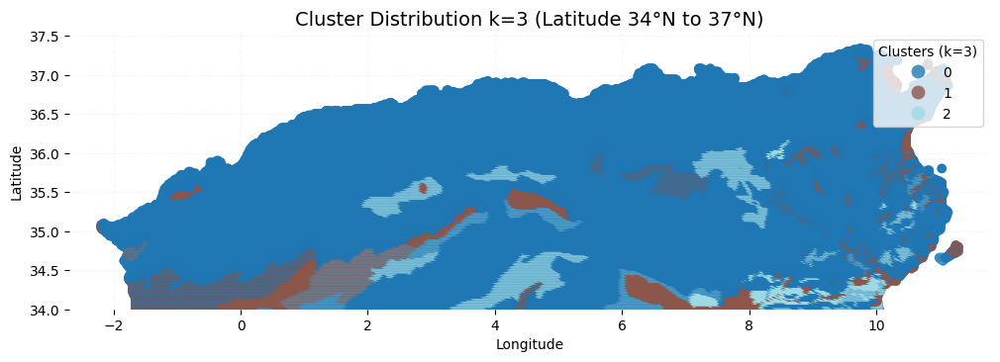

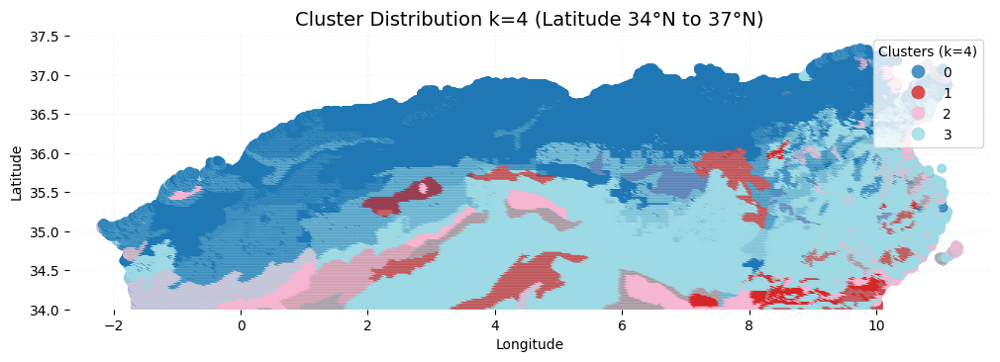

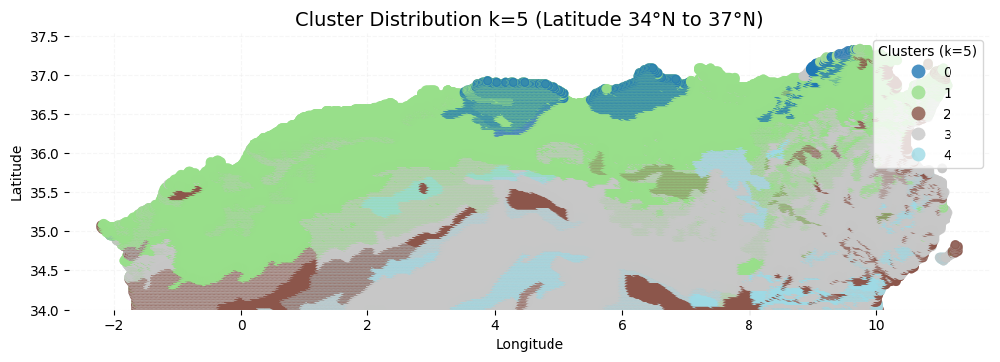

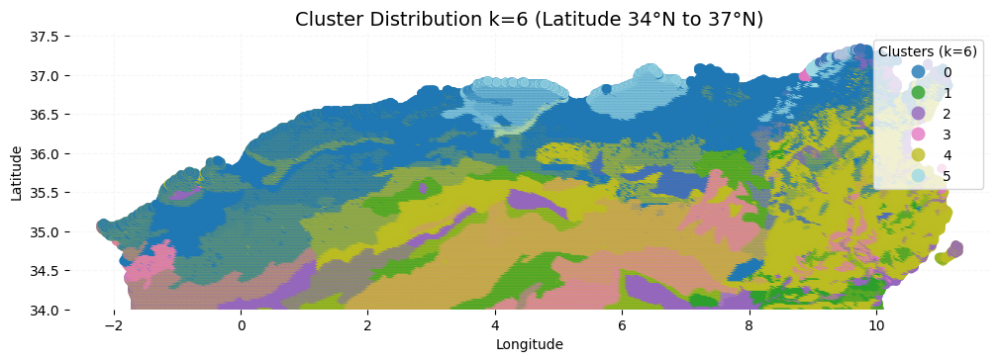

In [42]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import box
import os

# 1. Load coordinates (stays the same for all files)
coords = pd.read_csv("Cleaned_dataset/unsupervised/long_lat_attributes.csv")
lat_col = [c for c in coords.columns if 'lat' in c.lower()][0]
lon_col = [c for c in coords.columns if 'lon' in c.lower() or 'long' in c.lower()][0]

# 2. Prepare Map Data once (saves time and memory)
world_url = "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/world-countries.json"
world = gpd.read_file(world_url)
countries = world[world['name'].isin(["Algeria", "Tunisia"])]

# Clip map strictly to show Lat 34-40
xmin, ymin, xmax, ymax = countries.total_bounds
clipping_rect = box(xmin, 34, xmax, 40) 
countries_clipped = countries.clip(clipping_rect)

# 3. Loop through files from k=3 to k=16
for k in range(3, 17):
    file_path = f"kmeans_models_outputs_freq/data_kmeans_k{k}_pca99.csv"
    
    # Check if file exists
    if not os.path.exists(file_path):
        continue

    # Load specific cluster file
    clusters = pd.read_csv(file_path)

    # Combine
    df = pd.concat([coords, clusters[['cluster']]], axis=1)

    # 4. Filter strictly for Latitude > 34
    df_filtered = df[df[lat_col] > 34].copy()

    # 5. Convert to GeoDataFrame
    gdf = gpd.GeoDataFrame(
        df_filtered, 
        geometry=gpd.points_from_xy(df_filtered[lon_col], df_filtered[lat_col]),
        crs="EPSG:4326"
    )

    # 6. Plotting (Exact style from your code)
    fig, ax = plt.subplots(figsize=(12, 12)) 

    # NO BLACK: Land is white, borders are invisible
    countries_clipped.plot(ax=ax, color='white', edgecolor='none', zorder=1)

    # Plot the clusters 
    # (Using tab20 because you have up to 16 clusters)
    gdf.plot(column='cluster', 
             ax=ax, 
             categorical=True, 
             legend=True, 
             cmap='tab20', 
             markersize=35,      
             alpha=0.8,          
             zorder=2,
             legend_kwds={'title': f"Clusters (k={k})", 'loc': 'upper right'})

    # 7. VIEWPORT LOGIC: FORCE 34 to Max Lat
    ax.set_ylim(34, df_filtered[lat_col].max() + 0.2)
    ax.set_xlim(df_filtered[lon_col].min() - 0.5, df_filtered[lon_col].max() + 0.5)

    # Remove all black frame lines
    for spine in ax.spines.values():
        spine.set_visible(False)

    # Styling
    plt.title(f"Cluster Distribution k={k} (Latitude 34°N to 37°N)", fontsize=14)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    # Light grid
    ax.grid(True, linestyle='--', color='#eeeeee', alpha=0.5)

plt.show()

In [2]:
df = pd.read_csv('Cleaned_dataset/unsupervised/data_cl.csv')
df = df.drop(columns=["latitude", "longitude", "HWSD2_SMU_ID"], errors="ignore")
print(df.columns)
print(df.shape)
# --- 1. PREPROCESSING FOR PRINCE ---
# Prince identifies categories by their Dtype (object/category)
# Reconstruct Gridcode and texture_soter into strings
print("Reconstructing categorical features for Prince...")
df['GRIDCODE'] = df['GRIDCODE'].astype(str)
df['TEXTURE_SOTER'] = df['TEXTURE_SOTER'].astype(str)

# Ensure other categorical columns are also strings/objects
# Example: cat_cols = ['Gridcode', 'texture_soter'] 

# --- 2. FAMD USING THE PRINCE LIBRARY ---
print("Running Prince FAMD (Fitting on sample, transforming full)...")

# 100k is usually enough for FAMD to learn the variance rules
famd_sample = df.sample(n=min(100000, len(df)), random_state=42)

famd = FAMD(
    n_components=30,    # Number of features to keep
    n_iter=3,           # Iterations for SVD
    copy=True,
    check_input=True,
    engine='sklearn',   # Use sklearn engine for stability
    random_state=42
)

# Fit on sample
famd = famd.fit(famd_sample)

# Transform the ENTIRE dataset (850k rows)
# This results in a purely numerical DataFrame of 850k x 15
df = famd.transform(df)

Index(['COARSE', 'SAND', 'SILT', 'CLAY', 'TEXTURE_SOTER', 'BULK', 'REF_BULK',
       'ORG_CARBON', 'PH_WATER', 'TOTAL_N', 'CN_RATIO', 'CEC_SOIL', 'CEC_CLAY',
       'CEC_EFF', 'TEB', 'BSAT', 'ALUM_SAT', 'ESP', 'TCARBON_EQ', 'GYPSUM',
       'ELEC_COND', 'elevation', 'winter_prec', 'spring_prec', 'summer_prec',
       'autumn_prec', 'winter_tmax', 'spring_tmax', 'summer_tmax',
       'autumn_tmax', 'winter_tmin', 'spring_tmin', 'summer_tmin',
       'autumn_tmin', 'GRIDCODE', 'fire_count'],
      dtype='object')
(211489, 36)
Reconstructing categorical features for Prince...
Running Prince FAMD (Fitting on sample, transforming full)...


DATA SHAPE: (211489, 30)
K range: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]

################################################################################
TRAINING KMEANS | K = 3
################################################################################
→ Fitting model on FULL dataset...
✓ Training completed
→ Computing Davies-Bouldin Index...
  Davies-Bouldin: 2.0127
→ Computing Calinski-Harabasz Index...
  Calinski-Harabasz: 28802.9012
→ Silhouette evaluation on 4 random 20% subsets
  Subset 1 | random_state=42
    Silhouette score: 0.1600
  Subset 2 | random_state=43
    Silhouette score: 0.1565
  Subset 3 | random_state=44
    Silhouette score: 0.1581
  Subset 4 | random_state=45
    Silhouette score: 0.1567
→ Average Silhouette (K=3): 0.1578
→ Saving clustered dataset...
✓ CSV saved: kmeans_models_outputs_famd\data_kmeans_k3.csv

################################################################################
TRAINING KMEANS | K = 4
#######################################

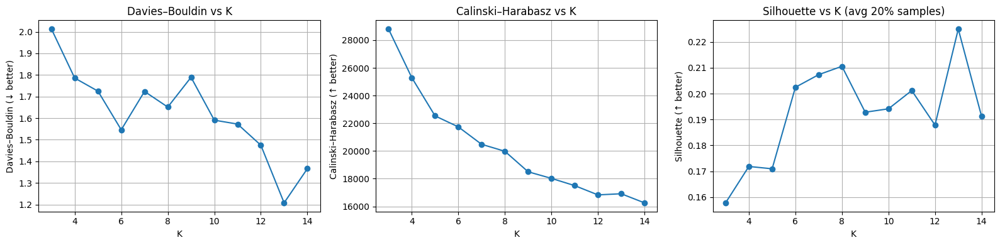

In [3]:

from sklearn.cluster import KMeans
from sklearn.metrics import (
    davies_bouldin_score,
    calinski_harabasz_score,
    silhouette_score
)

from sklearn.utils import shuffle

# ==============================
# CONFIG
# ==============================
OUTPUT_DIR = "kmeans_models_outputs_famd"
os.makedirs(OUTPUT_DIR, exist_ok=True)

K_RANGE = range(3, 15)
SILHOUETTE_SAMPLE_RATIO = 0.20
SILHOUETTE_REPEATS = 4
BASE_RANDOM_STATE = 42

X = df.values  # ensure numpy array

print("=" * 80)
print(f"DATA SHAPE: {X.shape}")
print(f"K range: {list(K_RANGE)}")
print("=" * 80)

results = []

# ==============================
# MAIN LOOP
# ==============================
for k in K_RANGE:
    print("\n" + "#" * 80)
    print(f"TRAINING KMEANS | K = {k}")
    print("#" * 80)

    # --------------------------
    # Train on FULL DATA
    # --------------------------
    kmeans = KMeans(
        n_clusters=k,
        init="k-means++",
        n_init=10,
        max_iter=300,
        random_state=BASE_RANDOM_STATE
    )

    print("→ Fitting model on FULL dataset...")
    labels_full = kmeans.fit_predict(X)
    print("✓ Training completed")

    # --------------------------
    # Internal metrics (FULL DATA)
    # --------------------------
    print("→ Computing Davies-Bouldin Index...")
    db_index = davies_bouldin_score(X, labels_full)
    print(f"  Davies-Bouldin: {db_index:.4f}")

    print("→ Computing Calinski-Harabasz Index...")
    ch_index = calinski_harabasz_score(X, labels_full)
    print(f"  Calinski-Harabasz: {ch_index:.4f}")

    # --------------------------
    # Silhouette (SUBSAMPLING)
    # --------------------------
    silhouette_scores = []
    sample_size = int(SILHOUETTE_SAMPLE_RATIO * len(X))

    print(f"→ Silhouette evaluation on {SILHOUETTE_REPEATS} random 20% subsets")

    for i in range(SILHOUETTE_REPEATS):
        rs = BASE_RANDOM_STATE + i
        print(f"  Subset {i+1} | random_state={rs}")

        X_sub, labels_sub = shuffle(
            X, labels_full, random_state=rs
        )

        X_sub = X_sub[:sample_size]
        labels_sub = labels_sub[:sample_size]

        sil = silhouette_score(
            X_sub, labels_sub, metric="euclidean"
        )

        silhouette_scores.append(sil)
        print(f"    Silhouette score: {sil:.4f}")

    silhouette_avg = np.mean(silhouette_scores)
    print(f"→ Average Silhouette (K={k}): {silhouette_avg:.4f}")

    # --------------------------
    # Save clustered CSV
    # --------------------------
    print("→ Saving clustered dataset...")

    clustered_df = df.copy()
    clustered_df["cluster"] = labels_full

    output_path = os.path.join(
        OUTPUT_DIR, f"data_kmeans_k{k}.csv"
    )
    clustered_df.to_csv(output_path, index=False)

    print(f"✓ CSV saved: {output_path}")

    # --------------------------
    # Store results
    # --------------------------
    results.append({
        "k": k,
        "davies_bouldin": db_index,
        "calinski_harabasz": ch_index,
        "silhouette_avg": silhouette_avg
    })

# ==============================
# FINAL SUMMARY TABLE
# ==============================
results_df = pd.DataFrame(results)

print("\n" + "=" * 80)
print("FINAL METRICS SUMMARY")
print("=" * 80)
print(results_df)

summary_path = os.path.join(OUTPUT_DIR, "kmeans_metrics_summary.csv")
results_df.to_csv(summary_path, index=False)

print("\n✓ Metrics summary saved to:", summary_path)
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 4))

# Davies-Bouldin
plt.subplot(1, 3, 1)
plt.plot(results_df["k"], results_df["davies_bouldin"], marker="o")
plt.title("Davies–Bouldin vs K")
plt.xlabel("K")
plt.ylabel("Davies–Bouldin (↓ better)")
plt.grid(True)

# Calinski-Harabasz
plt.subplot(1, 3, 2)
plt.plot(results_df["k"], results_df["calinski_harabasz"], marker="o")
plt.title("Calinski–Harabasz vs K")
plt.xlabel("K")
plt.ylabel("Calinski–Harabasz (↑ better)")
plt.grid(True)

# Silhouette
plt.subplot(1, 3, 3)
plt.plot(results_df["k"], results_df["silhouette_avg"], marker="o")
plt.title("Silhouette vs K (avg 20% samples)")
plt.xlabel("K")
plt.ylabel("Silhouette (↑ better)")
plt.grid(True)

plt.tight_layout()
plt.show()


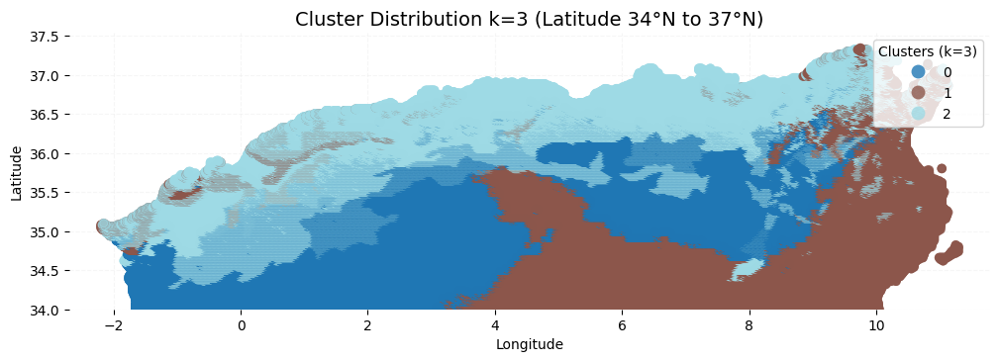

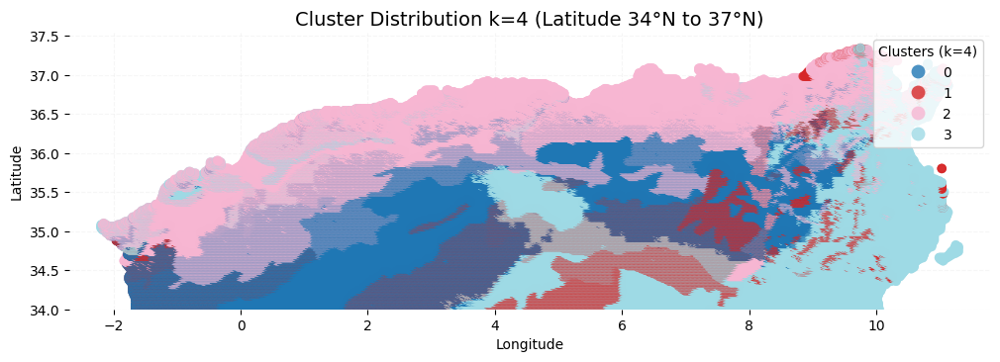

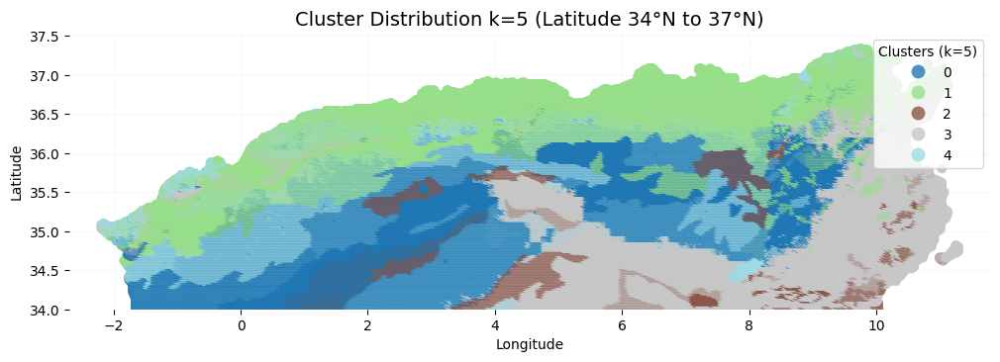

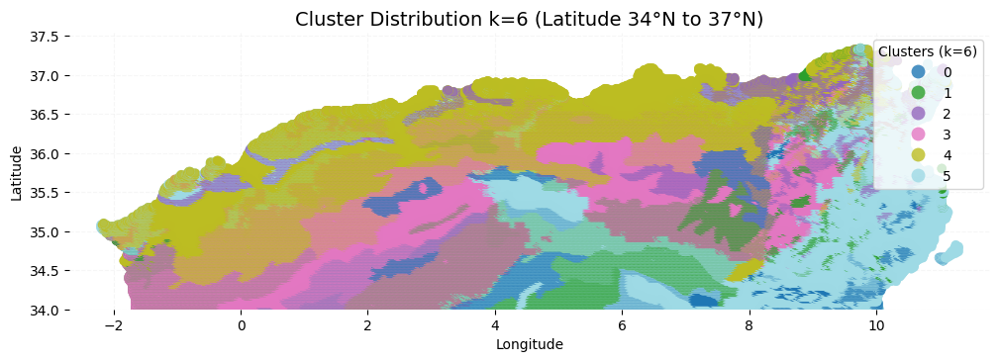

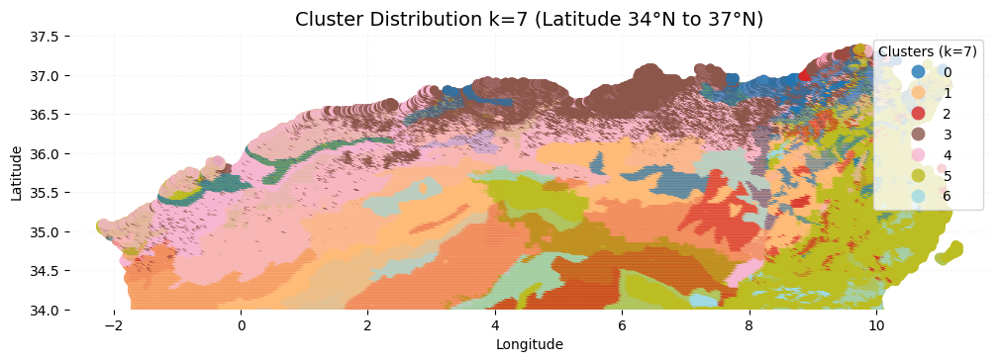

...

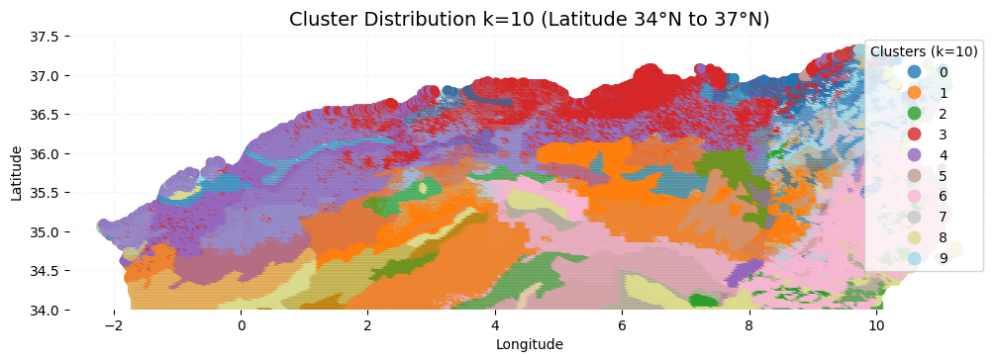

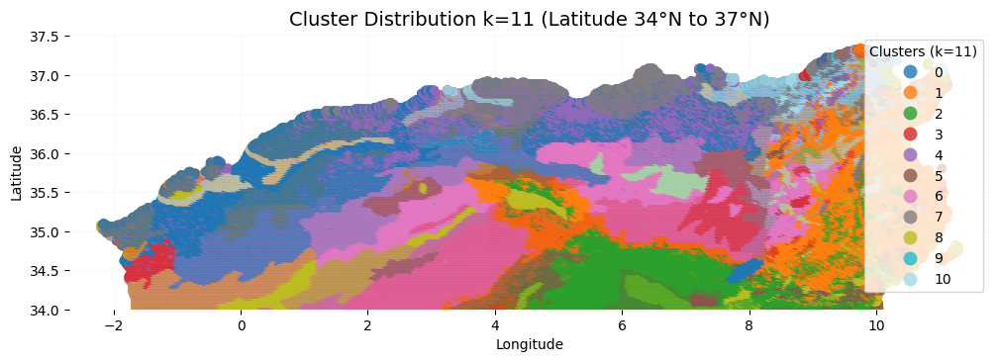

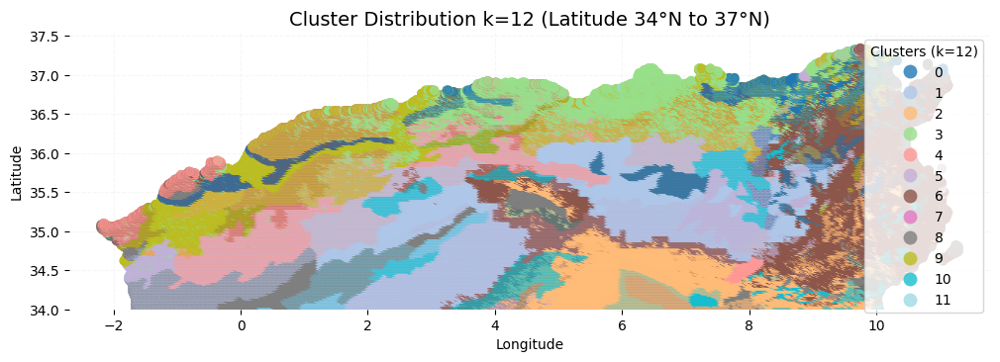

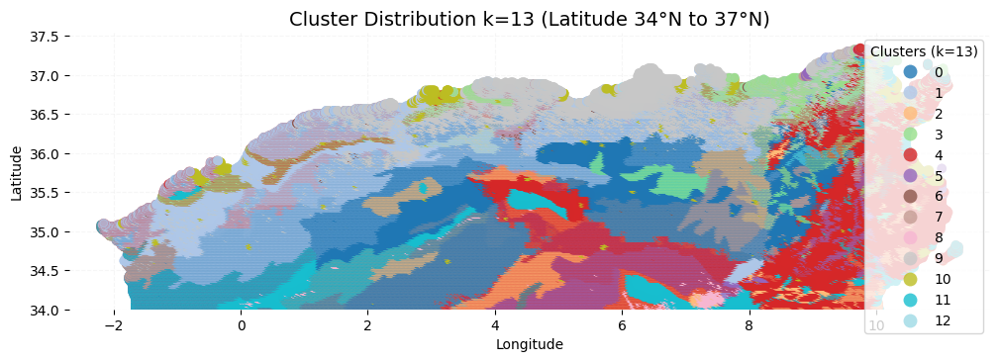

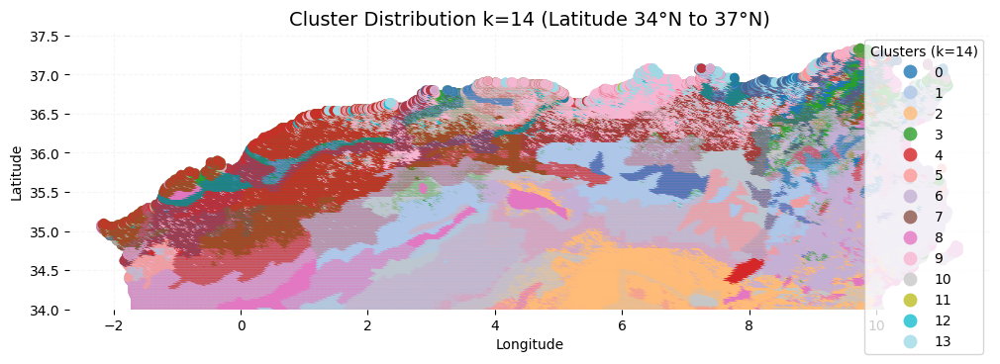

In [6]:
# 1. Load coordinates (stays the same for all files)
coords = pd.read_csv("Cleaned_dataset/unsupervised/long_lat_attributes.csv")
lat_col = [c for c in coords.columns if 'lat' in c.lower()][0]
lon_col = [c for c in coords.columns if 'lon' in c.lower() or 'long' in c.lower()][0]

# 2. Prepare Map Data once (saves time and memory)
world_url = "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/world-countries.json"
world = gpd.read_file(world_url)
countries = world[world['name'].isin(["Algeria", "Tunisia"])]

# Clip map strictly to show Lat 34-40
xmin, ymin, xmax, ymax = countries.total_bounds
clipping_rect = box(xmin, 34, xmax, 40) 
countries_clipped = countries.clip(clipping_rect)

# 3. Loop through files from k=3 to k=16
for k in range(3, 15):
    file_path = f"kmeans_models_outputs_famd/data_kmeans_k{k}.csv"
    
    # Check if file exists
    if not os.path.exists(file_path):
        continue

    # Load specific cluster file
    clusters = pd.read_csv(file_path)

    # Combine
    df = pd.concat([coords, clusters[['cluster']]], axis=1)

    # 4. Filter strictly for Latitude > 34
    df_filtered = df[df[lat_col] > 34].copy()

    # 5. Convert to GeoDataFrame
    gdf = gpd.GeoDataFrame(
        df_filtered, 
        geometry=gpd.points_from_xy(df_filtered[lon_col], df_filtered[lat_col]),
        crs="EPSG:4326"
    )

    # 6. Plotting (Exact style from your code)
    fig, ax = plt.subplots(figsize=(12, 12)) 

    # NO BLACK: Land is white, borders are invisible
    countries_clipped.plot(ax=ax, color='white', edgecolor='none', zorder=1)

    # Plot the clusters 
    # (Using tab20 because you have up to 16 clusters)
    gdf.plot(column='cluster', 
             ax=ax, 
             categorical=True, 
             legend=True, 
             cmap='tab20', 
             markersize=35,      
             alpha=0.8,          
             zorder=2,
             legend_kwds={'title': f"Clusters (k={k})", 'loc': 'upper right'})

    # 7. VIEWPORT LOGIC: FORCE 34 to Max Lat
    ax.set_ylim(34, df_filtered[lat_col].max() + 0.2)
    ax.set_xlim(df_filtered[lon_col].min() - 0.5, df_filtered[lon_col].max() + 0.5)

    # Remove all black frame lines
    for spine in ax.spines.values():
        spine.set_visible(False)

    # Styling
    plt.title(f"Cluster Distribution k={k} (Latitude 34°N to 37°N)", fontsize=14)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    # Light grid
    ax.grid(True, linestyle='--', color='#eeeeee', alpha=0.5)

plt.show()